In [ ]:
# !pip install onnx

In [ ]:
import tensorflow as tf

#### might have got the error cuz the protobuff package is newer than the version tf needs so downgrage the protobuff version

In [ ]:
# !pip install protobuf==3.20.3

In [ ]:
import tf2onnx.convert

In [ ]:
# !pip install tf2onnx

In [ ]:
import tf2onnx.convert

In [ ]:
import onnx

In [ ]:
## load the saved model
from tensorflow.keras.models import load_model

In [ ]:
import numpy as np
import cv2
import os
from tqdm import tqdm as tqdm
import tensorflow as tf
import matplotlib.pyplot as plt
from keras.losses import binary_crossentropy
from keras import backend as K
import segmentation_models as sm
# from keras.utils import to_categorical
from tensorflow.keras.utils import to_categorical
from tensorflow.python.keras.utils import generic_utils
from segmentation_models.losses import CategoricalFocalLoss
from tensorflow.keras.optimizers import Adam,SGD
from tensorflow.keras.utils import to_categorical

from keras.callbacks import Callback, EarlyStopping, ReduceLROnPlateau,ModelCheckpoint
# from keras.optimizers import Adam,SGD
from keras.losses import BinaryCrossentropy
from keras.metrics import MeanIoU
from glob import glob
import tensorflow_model_optimization as tfmot
from tensorflow_model_optimization.quantization.keras import QuantizeConfig
import tensorflow_model_optimization as tfmot

In [ ]:
import tensorflow_model_optimization as tfmot
from tensorflow_model_optimization.python.core.quantization.keras.quantizers import MovingAverageQuantizer, LastValueQuantizer
from tensorflow_model_optimization.python.core.quantization.keras.quantize_config import QuantizeConfig
from keras.layers import Layer
from segmentation_models.metrics import  f1_score,precision,recall
from segmentation_models.metrics import  f1_score
from tensorflow.keras.callbacks import TensorBoard
import datetime

# Custom QuantizeConfig for Conv2D layers
class ConvQuantizeConfig(QuantizeConfig):
    def get_weights_and_quantizers(self, layer):
        return [(layer.kernel, LastValueQuantizer(num_bits=4, per_axis=False, symmetric=False, narrow_range=False))]

    def get_activations_and_quantizers(self, layer):
        return [(layer.activation, MovingAverageQuantizer(num_bits=4, per_axis=False, symmetric=False, narrow_range=False))]

    def set_quantize_weights(self, layer, quantize_weights):
        layer.kernel = quantize_weights[0]
    def set_quantize_activations(self, layer, quantize_activations):
        layer.activation = quantize_activations[0]

    def get_output_quantizers(self, layer):
        # Does not quantize output, since we return an empty list.
        return []

    def get_config(self):
        return {}


In [ ]:
tf.keras.utils.register_keras_serializable(package='QuantizeConfig')(ConvQuantizeConfig)

In [ ]:
loss_function = sm.losses.bce_dice_loss 
# Define custom objects needed to load the model
custom_objects = {
    'ConvQuantizeConfig': ConvQuantizeConfig,
    'binary_crossentropy_plus_jaccard_loss': sm.losses.bce_jaccard_loss,
    'iou_score': sm.metrics.iou_score,
    'f1-score': sm.metrics.f1_score,
    'precision': sm.metrics.precision,
    'recall': sm.metrics.recall,
}

In [ ]:
# Load the model with custom objects
model_path = '/home/agrograde/Desktop/6th_july/24_MB_QUANTIZATION/onin_28th_june_spplrobg_28thjune2024.h5'
with tfmot.quantization.keras.quantize_scope(custom_objects):
    model = tf.keras.models.load_model(model_path)

In [ ]:
onnx_model,_ = tf2onnx.convert.from_keras(model)

In [ ]:
onnx.save(onnx_model,"onnx_model.onnx")

## Test

In [ ]:
# !pip install onnxruntime


In [ ]:
import onnxruntime
import cv2
import numpy as np

# Load the ONNX model
session = onnxruntime.InferenceSession("/home/agrograde/Desktop/6th_july/ONNX/onnx_model.onnx")

# Get input name
input_name = session.get_inputs()[0].name

# Get all output names
output_names = [output.name for output in session.get_outputs()]

# Load and preprocess the image
image_path = r"/home/agrograde/Desktop/6th_july/ONNX/test_image/130423_10_1.jpg"
img = cv2.imread(image_path)
img = cv2.resize(img, (224, 224))
I = img.reshape([1, 224, 224, 3]).astype(np.float32)  # Ensure the array is of type float32

# Run the model and get all outputs
result = session.run(output_names, {input_name: I})

# Print the results
for i, output in enumerate(result):
    print(f"Output {i+1}: {output}")

In [ ]:
import os
import cv2
import numpy as np
import onnxruntime
import time
import matplotlib.pyplot as plt

# Define model input shape (replace h and w with actual values)
h, w = 224, 224  # Example values, replace with your model's expected input size

# Load the ONNX model
model_path = "/home/agrograde/Desktop/6th_july/ONNX/onnx_model.onnx"
session = onnxruntime.InferenceSession(model_path)
input_name = session.get_inputs()[0].name
output_names = [output.name for output in session.get_outputs()]

# Function to perform inference and visualize results
def getPrediction(img_path):
    for image in os.listdir(img_path):
        print(f"Name of the image: {image}")

        if image.endswith('.jpg'):
            img = cv2.imread(os.path.join(img_path, image))
            im = cv2.resize(img, (h, w))

            # Prepare input as float32 and normalize
            I = im.astype(np.float32)
            I = I.reshape([1, h, w, 3])

            # Perform inference
            start = time.time()
            preds = session.run(output_names, {input_name: I})
            print(f"Inference time: {(time.time() - start):.2f} sec")

            # Process ONNX outputs
            sp_mask = np.argmax(preds[0], axis=3).reshape([h, w])
            pl_mask = np.argmax(preds[1], axis=3).reshape([h, w])
            ro_mask = np.argmax(preds[2], axis=3).reshape([h, w])
            db_mask = np.argmax(preds[3], axis=3).reshape([h, w])
            bg_mask = np.argmax(preds[4], axis=3).reshape([h, w])

            # Visualize results
            visualize_results(im, sp_mask, pl_mask, ro_mask, db_mask, bg_mask)

def visualize_results(img, sp_mask, pl_mask, ro_mask, db_mask, bg_mask):
    # Visualization settings and masks combination
    sp_color = (255, 255, 0)
    pl_color = (252, 51, 255)
    ro_color = (230, 126, 34)
    db_color = (0, 255, 255)
    bg_color = (45, 255, 11)

    # Create combined mask and visualize
    combined_mask = getCombinedMask(img, [sp_mask, pl_mask, ro_mask, db_mask, bg_mask])
    gray = np.dot(combined_mask[..., :3], [0.299, 0.587, 0.114])
    binary_mask = np.where(gray > 0, 1, 0)

    # Calculate and print area percentages
    sprout_area = getPercentArea(binary_mask, sp_mask)
    peeled_area = getPercentArea(binary_mask, pl_mask)
    rotten_area = getPercentArea(binary_mask, ro_mask)
    double_area = getPercentArea(binary_mask, db_mask)
    background_area = getPercentArea(binary_mask, bg_mask)

    print(f"Sprout Area: {sprout_area:.2f}%, Peeled Area: {peeled_area:.2f}%, Rotten Area: {rotten_area:.2f}%, Double Area: {double_area:.2f}%, Background Area: {background_area:.2f}%")

    # Plotting results
    plt.figure(figsize=(15, 10))

    # Original image
    plt.subplot(231)
    plt.imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
    plt.title('Original Image')

    # Individual masks
    plt.subplot(232)
    plt.imshow(sp_mask, cmap='gray')
    plt.title('Sprout Mask')

    plt.subplot(233)
    plt.imshow(pl_mask, cmap='gray')
    plt.title('Peeled Mask')

    plt.subplot(234)
    plt.imshow(ro_mask, cmap='gray')
    plt.title('Rotten Mask')

    plt.subplot(235)
    plt.imshow(db_mask, cmap='gray')
    plt.title('Double Mask')

    plt.subplot(236)
    plt.imshow(bg_mask, cmap='gray')
    plt.title('Background Mask')

    # Combined mask
    plt.figure(figsize=(8, 8))
    plt.imshow(combined_mask)
    plt.title('Combined Mask')

    plt.tight_layout()
    plt.show()

def getCombinedMask(img, masks):
    final_mask = np.zeros_like(img)

    for i, mask in enumerate(masks):
        mask_color = [0, 0, 0]
        if i == 0:  # Sprout
            mask_color = [255, 255, 0]
        elif i == 1:  # Peeled
            mask_color = [252, 51, 255]
        elif i == 2:  # Rotten
            mask_color = [230, 126, 34]
        elif i == 3:  # Double
            mask_color = [0, 255, 255]
        elif i == 4:  # Background
            mask_color = [45, 255, 11]

        final_mask[mask > 0] = mask_color

    return final_mask

def getPercentArea(full_mask, region_mask):
    total_area = np.sum(full_mask)
    region_area = np.sum(region_mask)
    area_percentage = (region_area / total_area) * 100 if total_area > 0 else 0
    return area_percentage

# Example usage
img_path = r'/home/agrograde/Desktop/6th_july/test/test_images/peeled'
getPrediction(img_path)


## Traditional_testing process

In [12]:
import numpy as np
import cv2
import os
from tqdm import tqdm_notebook as tqdm
import matplotlib.pyplot as plt
from tensorflow.keras.models import load_model, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Input,Conv2D,BatchNormalization,UpSampling2D,concatenate
import time
h,w = 224,224
import tensorflow as tf

In [13]:
 print('Num GPUs Available: ', len(tf.config.list_physical_devices('GPU')))

Num GPUs Available:  0


2024-07-10 16:51:55.222888: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:980] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2024-07-10 16:51:55.223166: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/agrograde/.local/lib/python3.8/site-packages/cv2/../../lib64:
2024-07-10 16:51:55.223251: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublas.so.11'; dlerror: libcublas.so.11: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /home/agrograde/.local/lib/python3.8/site-packages/cv2/../../lib64:
2024-07-10 16:51:55.223324: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcublasLt.so.11'; dlerror:

In [5]:
# # folder=['holes":1.0,"potato": 1.0,"rotten": 1.0,"cuts"]
def bbox(img, mask, flag):
    visuals = img.copy()
    if flag=='sp':
        color=(255,255,0)  
    if flag=='pl':
        color=(252,51,255)
    if flag=='ro':
        color=(230,126,34)
    if flag=='db':
        color=(0,255,255)

    if flag=="bg":
        color = (45,255,11)

    else:
        color = (230,126,34)
     
    

        
    contours = cv2.findContours(mask, cv2.RETR_CCOMP, cv2.CHAIN_APPROX_SIMPLE)[0]
    visuals = cv2.drawContours(img.copy(), contours, -1, color,1)
    return visuals

In [6]:
def getPercentArea(full_mask, region_mask):
    full_mask = cv2.resize(full_mask.astype(float), (224,224))
    total_area,region_area = np.sum(full_mask),np.sum(region_mask)
    area_percentage = (region_area/total_area)*100
    return area_percentage

global final_mask
def getCombinedMask(img, defect_masks):
    final_mask = np.zeros_like(img)
    sp_mask,pl_mask,ro_mask,db_mask,bg_mask = defect_masks

#     print(ho_mask.shape,po_mask.shape,ro_mask.shape,cu_mask.shape)

    for i in range(img.shape[0]):
        for j in range(img.shape[1]):
            if sp_mask[i,j]>0:
                final_mask[i,j,:]=[255,255,0]
            elif pl_mask[i,j]>0:
                final_mask[i,j,:]=[252,51,255]
            elif ro_mask[i,j]>0:
                final_mask[i,j,:]=[230,126,34]
            elif db_mask[i,j]>0:
                final_mask[i,j,:]=[0,255,255]
            elif bg_mask[i,j]>0:
                 final_mask[i,j,:]=[45,255,11]

           
            else:
                final_mask[i,j,:]=[45,255,11]
    
    return final_mask


In [9]:
import glob
import skimage
import matplotlib.pyplot as plt
import keras.backend as K
import time
global masks
masks = []
def calaculate(masks_lst):
    defect_candidates = []   
    def_seg = np.zeros(shape=(224,224,len(masks_lst)),dtype=np.uint8)
    for i in range(len(masks_lst)): #0 to 3
        mask = np.argmax(masks_lst[i], axis=3)
        mask = mask.reshape(224,224)
        mask = 255*mask.astype(np.uint8)
        mask_1 = cv2.resize(mask, (224,224))
        masks.append(mask_1)
        def_seg[:,:,i] = mask_1
        extent = np.sum(mask_1)
        defect_candidates.append(extent)
        defects = np.squeeze(np.array(defect_candidates[:])/(sum(defect_candidates)+1))*100



import onnxruntime

# Define model input shape (replace h and w with actual values)
h, w = 224, 224  # Example values, replace with your model's expected input size

# Load the ONNX model
model_path = "/home/agrograde/Desktop/6th_july/ONNX/onnx_model.onnx"
session = onnxruntime.InferenceSession(model_path)
input_name = session.get_inputs()[0].name
output_names = [output.name for output in session.get_outputs()]


def getPrediction(img_path):
    for image in os.listdir(img_path):
        print(f"name of the image {image}")     
        if image.endswith('.jpg'):
            img = cv2.imread(os.path.join(img_path,image))
            im = cv2.resize(img,(h,w))
            I = im.astype(np.float32)
            I = I.reshape([1, h, w, 3])
            # start = time.time()
            # preds = model_new.predict(I)
            # print(f"main pred hoon{len(preds)}")
            
            # Perform inference
            start = time.time()
            preds = session.run(output_names, {input_name: I})
           # print(f"Inference time: {(time.time() - start):.2f} sec")
            
            calaculate(preds)
            
            sp = np.argmax(preds[0], axis=3)
            sp = sp.reshape([h,w])
            
            pl= np.argmax(preds[1], axis=3)
            pl = pl.reshape([h,w])
                
            ro= np.argmax(preds[2], axis=3)
            ro = ro.reshape([h,w])
            
            db= np.argmax(preds[3], axis=3)
            db = pl.reshape([h,w])

            
            bg= np.argmax(preds[4], axis=3)
            bg = bg.reshape([h,w])
            
            print("Time taken for pred is : ",(time.time()-start),'sec')
            
            sp_vis = cv2.cvtColor(bbox(im, sp, 'sp'), cv2.COLOR_BGR2RGB)
#             
            pl_vis = cv2.cvtColor(bbox(im, pl, 'pl'), cv2.COLOR_BGR2RGB)

            ro_vis = cv2.cvtColor(bbox(im, ro, 'ro'), cv2.COLOR_BGR2RGB)

            db_vis = cv2.cvtColor(bbox(im, db, 'db'), cv2.COLOR_BGR2RGB)
            
            bg_vis = cv2.cvtColor(bbox(im, bg, 'bg'), cv2.COLOR_BGR2RGB)
            
            
            masks_stack = np.hstack((sp,pl,ro,db,bg))
            visuals_stack = np.hstack((sp_vis,pl_vis,ro_vis,db_vis,bg_vis))

            
            
            im = cv2.cvtColor(im , cv2.COLOR_BGR2RGB)
            all_masks = [sp,pl,ro,db,bg]
            combined_mask = getCombinedMask(im, all_masks)
            gray = np.dot(combined_mask[...,:3], [0.299, 0.587, 0.114])
            threshold = 0
            binary_1 = np.where(gray > threshold, 1, 0)
            plt.imshow(binary_1)
            plt.title("combined_mask")
            
            sprout_area = getPercentArea(binary_1, sp)
            peeled_area = getPercentArea(binary_1, pl)
            rotten_area = getPercentArea(binary_1, ro)
            double_area = getPercentArea(binary_1, db)
            background_area = getPercentArea(binary_1, bg)
            total_area = background_area
        
            r1,r2,r3,r4=((sprout_area*100)/total_area),((peeled_area*100)/total_area),((rotten_area*100)/total_area),((double_area*100)/total_area)

            plt.figure(figsize=(10,10))
            plt.subplot(1,3,1)
            plt.imshow(im)
            plt.title('original')
            
            plt.figure(figsize=(25,25))
            plt.subplot(1,3,3)
            plt.imshow(masks_stack)

            plt.figure(figsize=(40,40))
            plt.subplot(1,3,2)
            plt.imshow(visuals_stack)

            plt.title('visuals: sprout_area:{:.3f} %,peeled_area:{:.3f} %, rotten_area:{:.3f} %,double_area:{:.3f} %'.format(r1,r2,r3,r4))
    

            plt.show()


2024-07-10 16:49:43.613389291 [W:onnxruntime:Default, upsamplebase.h:101 UpsampleBase] `tf_half_pixel_for_nn` is deprecated since opset 13, yet this opset 13 model uses the deprecated attribute
2024-07-10 16:49:43.613416351 [W:onnxruntime:Default, upsamplebase.h:101 UpsampleBase] `tf_half_pixel_for_nn` is deprecated since opset 13, yet this opset 13 model uses the deprecated attribute
2024-07-10 16:49:43.613428083 [W:onnxruntime:Default, upsamplebase.h:101 UpsampleBase] `tf_half_pixel_for_nn` is deprecated since opset 13, yet this opset 13 model uses the deprecated attribute
2024-07-10 16:49:43.613438944 [W:onnxruntime:Default, upsamplebase.h:101 UpsampleBase] `tf_half_pixel_for_nn` is deprecated since opset 13, yet this opset 13 model uses the deprecated attribute


name of the image 020723_01_196_1.jpg
Time taken for pred is :  0.08358192443847656 sec


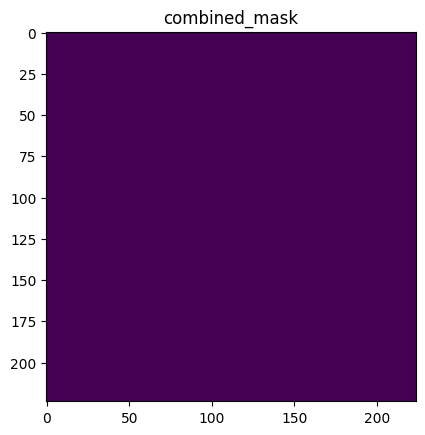

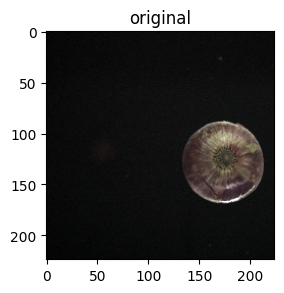

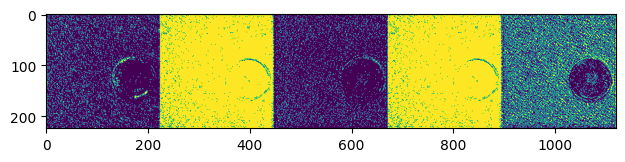

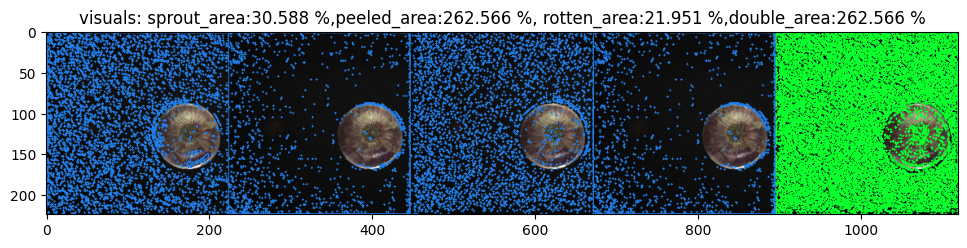

name of the image 010723_01_38_1.jpg
Time taken for pred is :  0.05329442024230957 sec


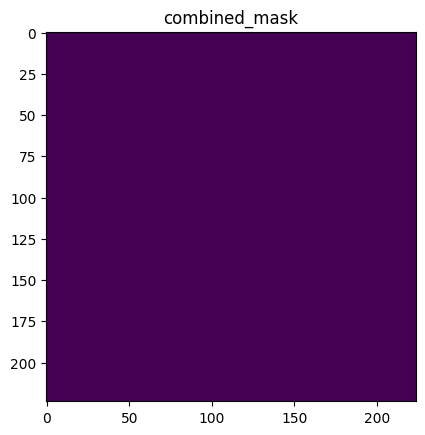

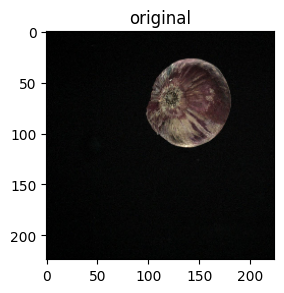

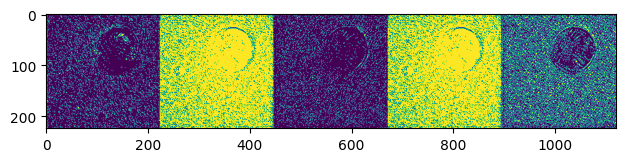

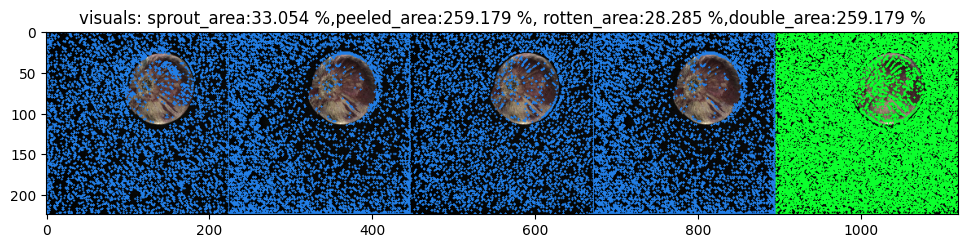

name of the image 020723_01_199_1.jpg
Time taken for pred is :  0.05044126510620117 sec


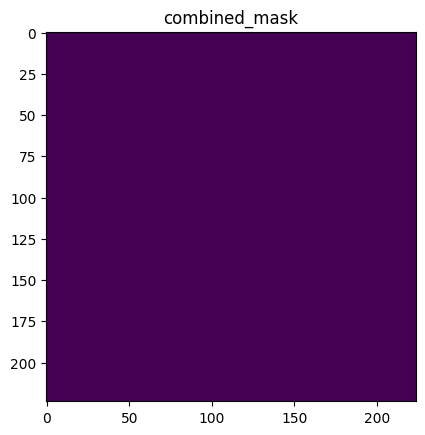

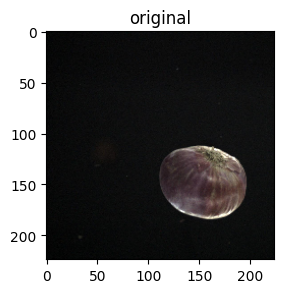

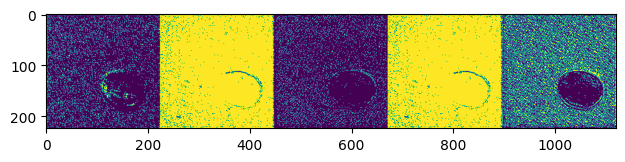

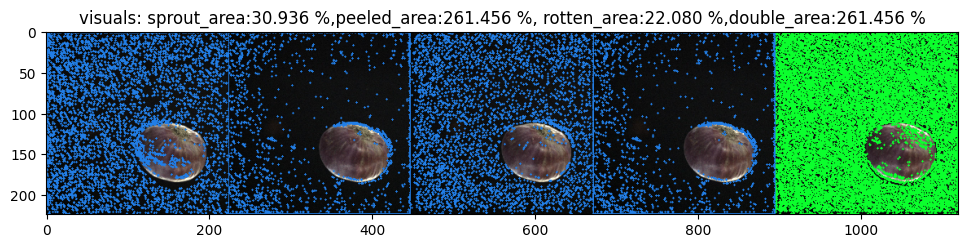

name of the image 020723_01_200_1.jpg
Time taken for pred is :  0.09554028511047363 sec


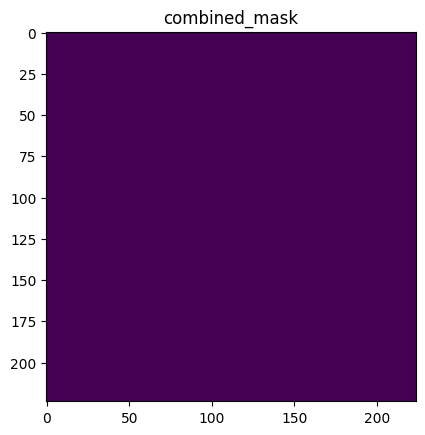

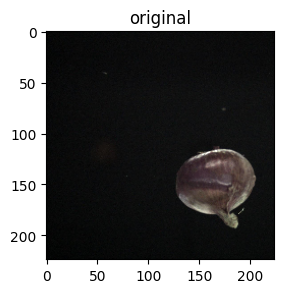

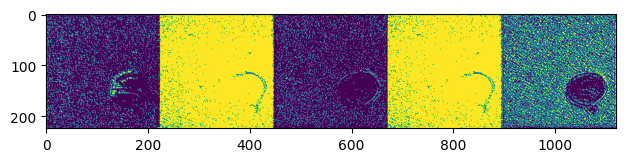

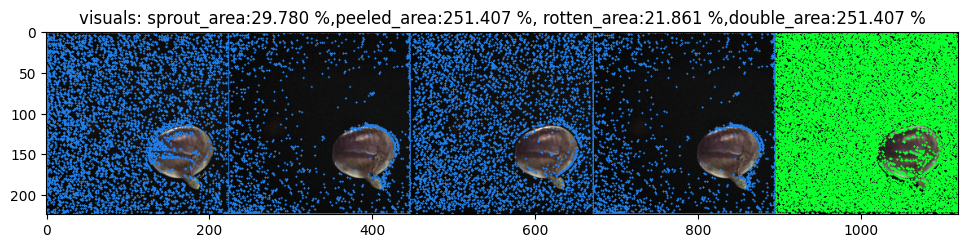

name of the image 010423_101_1.jpg
Time taken for pred is :  0.05492067337036133 sec


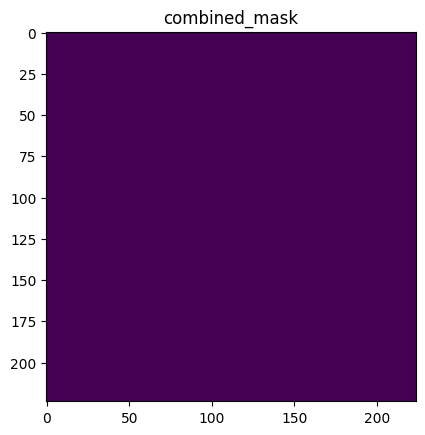

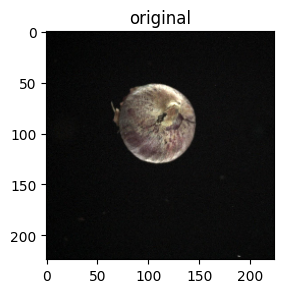

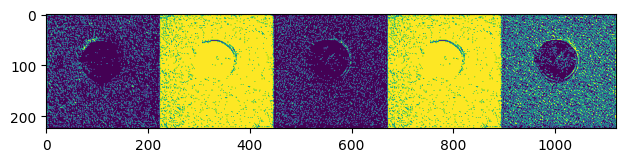

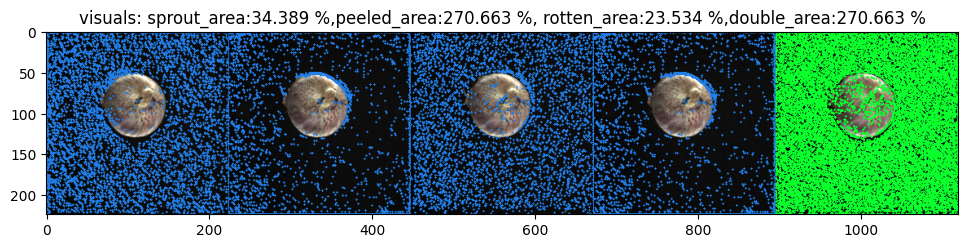

name of the image 351_1.jpg
Time taken for pred is :  0.05227494239807129 sec


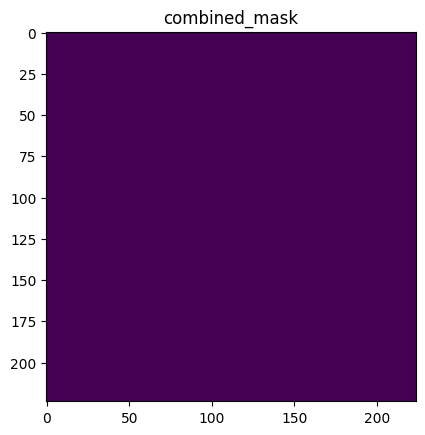

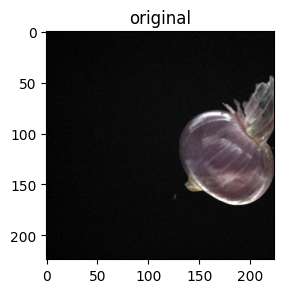

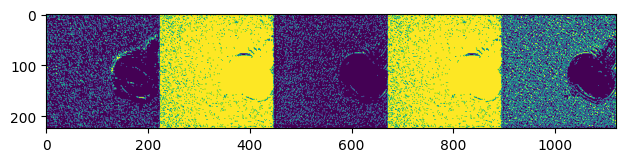

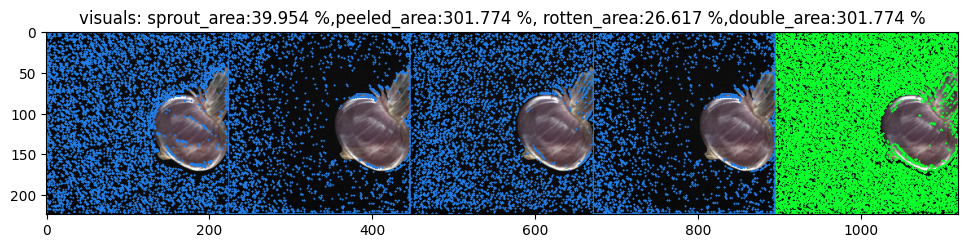

name of the image 339_1.jpg
Time taken for pred is :  0.05340099334716797 sec


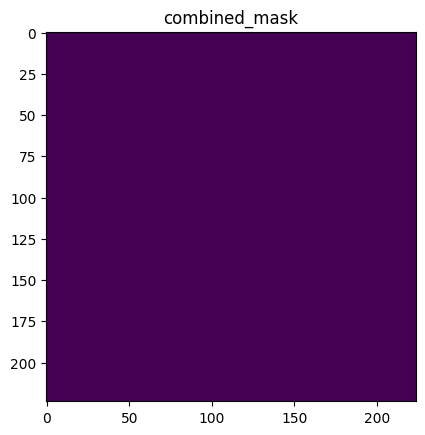

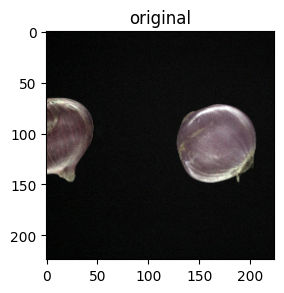

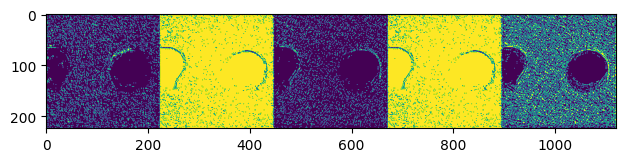

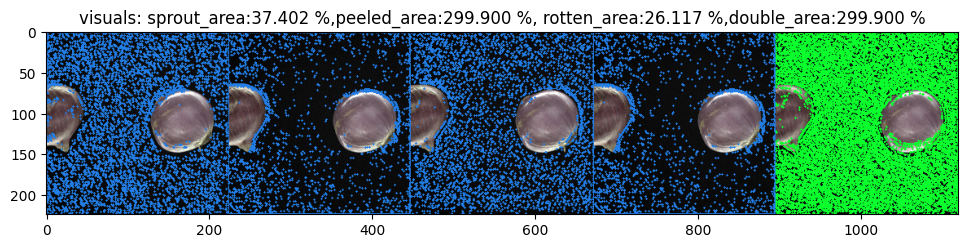

name of the image 348_1.jpg
Time taken for pred is :  0.05277204513549805 sec


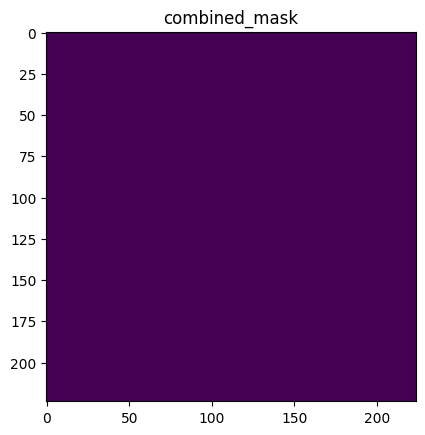

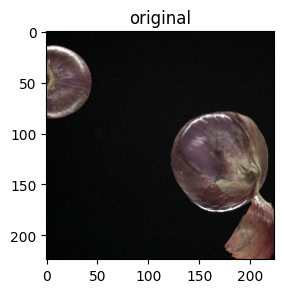

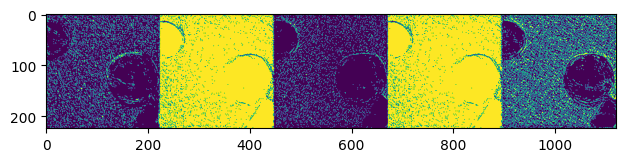

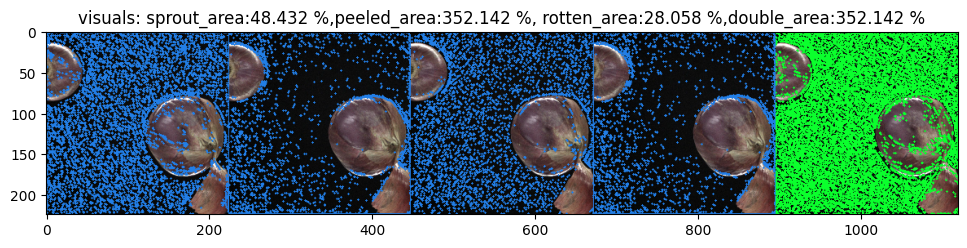

name of the image 356_1.jpg
Time taken for pred is :  0.0615839958190918 sec


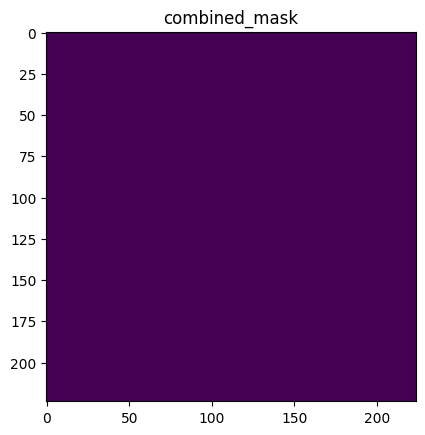

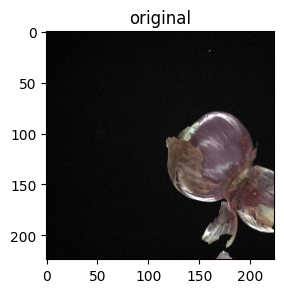

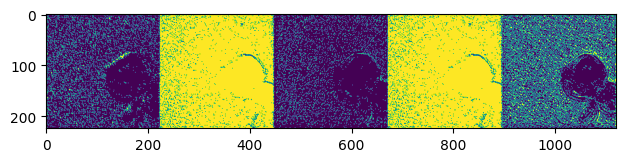

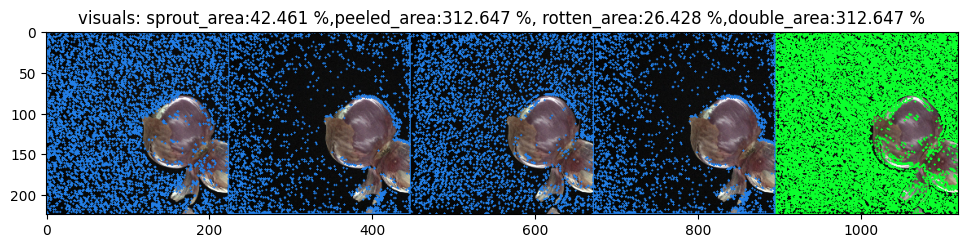

name of the image 327_1.jpg
Time taken for pred is :  0.08543658256530762 sec


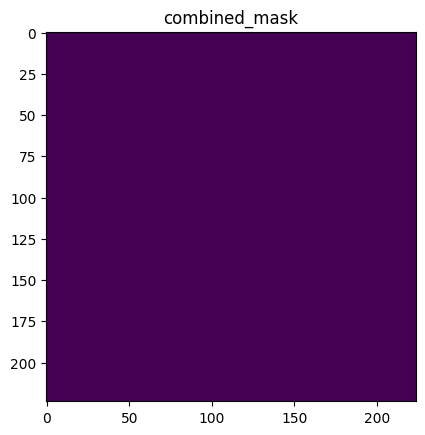

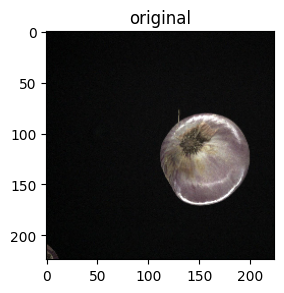

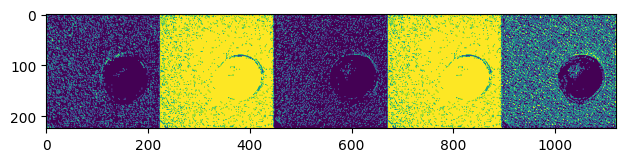

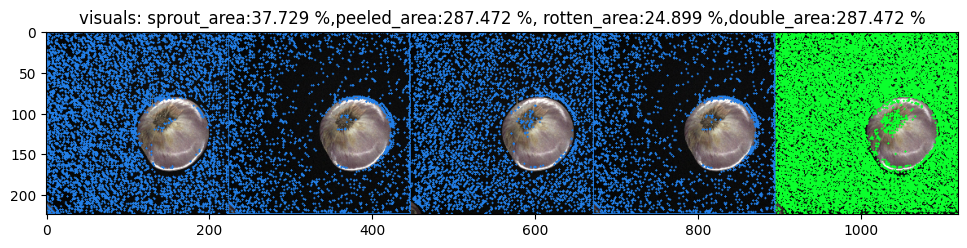

name of the image 020723_01_184_1.jpg
Time taken for pred is :  0.04954934120178223 sec


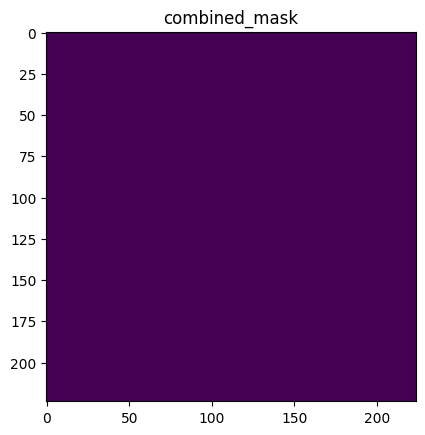

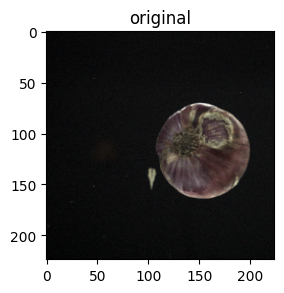

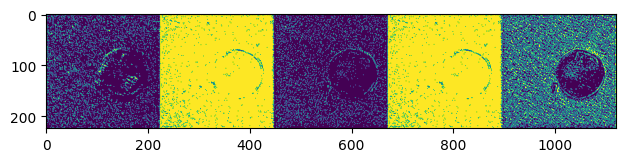

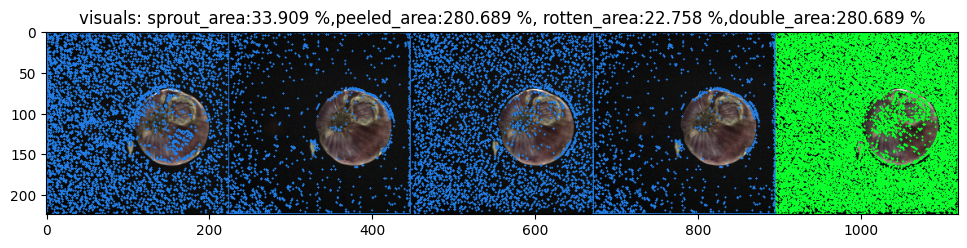

name of the image 020723_01_183_1.jpg
Time taken for pred is :  0.04663228988647461 sec


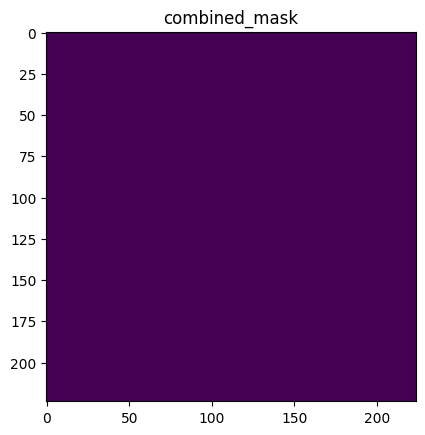

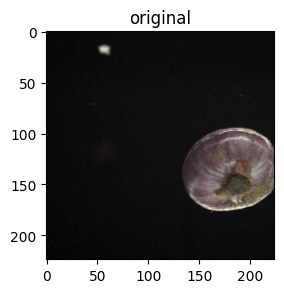

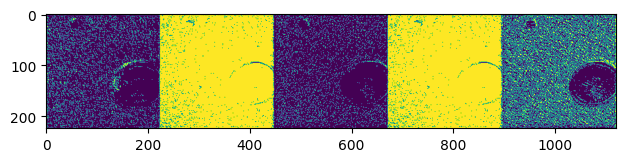

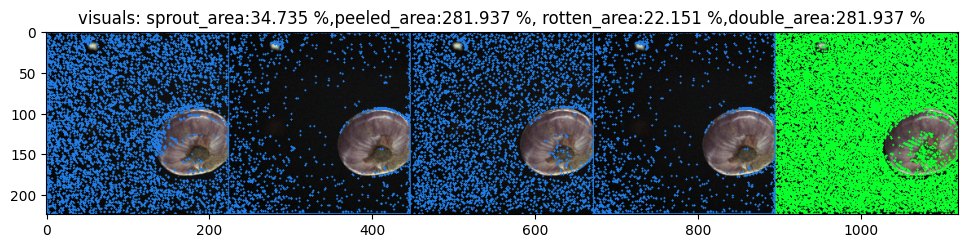

name of the image 372_1.jpg
Time taken for pred is :  0.04831957817077637 sec


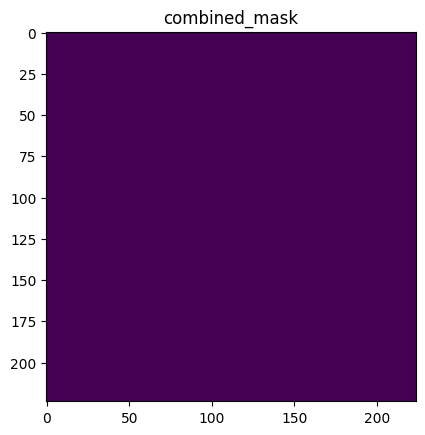

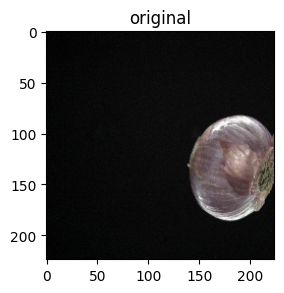

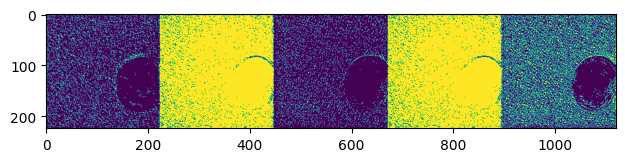

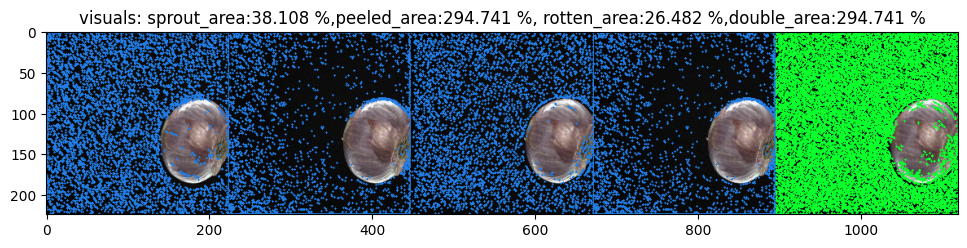

name of the image 020723_01_202_1.jpg
Time taken for pred is :  0.04696965217590332 sec


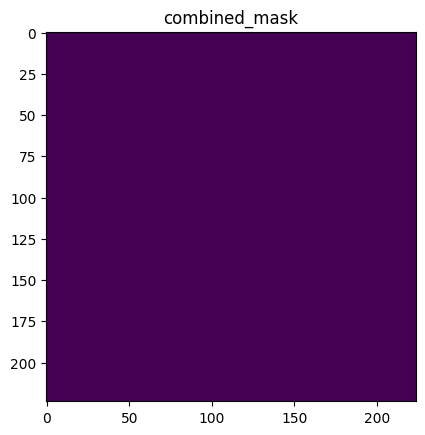

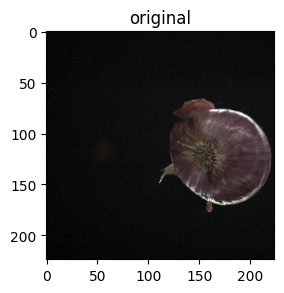

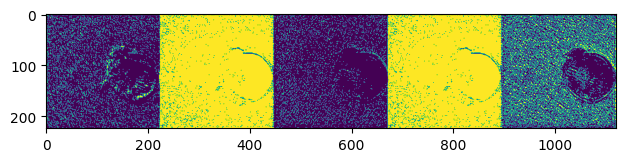

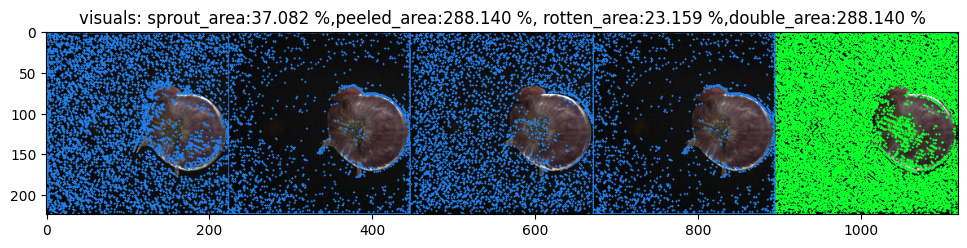

name of the image 020723_01_187_1.jpg
Time taken for pred is :  0.04681515693664551 sec


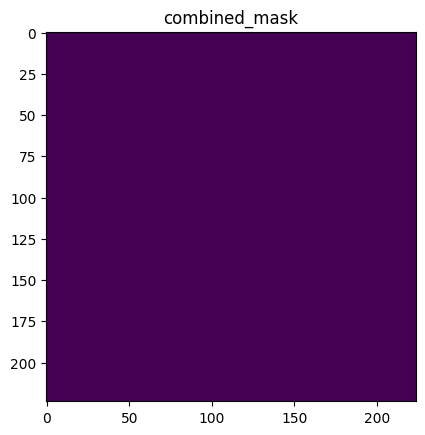

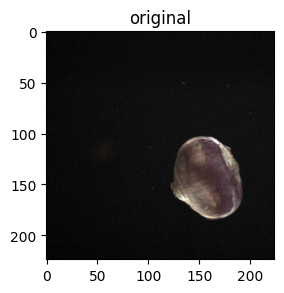

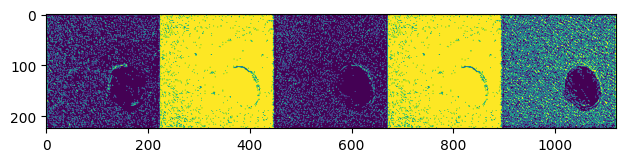

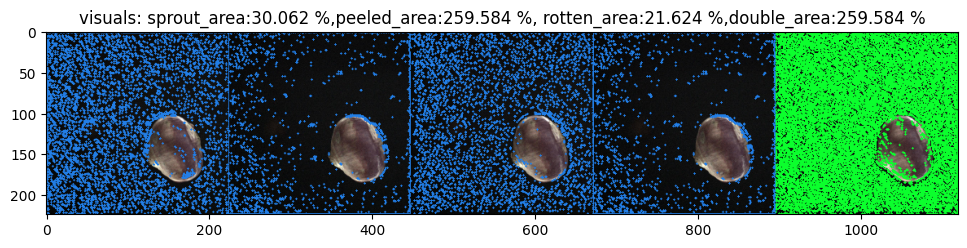

name of the image 020723_01_203_1.jpg
Time taken for pred is :  0.04986405372619629 sec


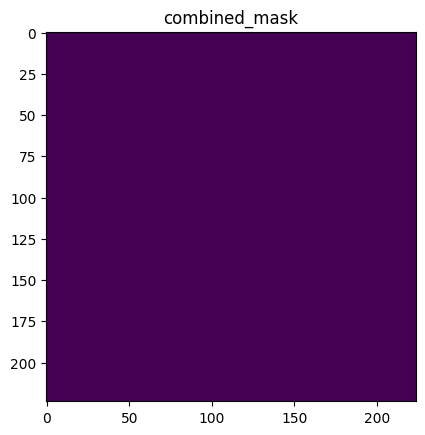

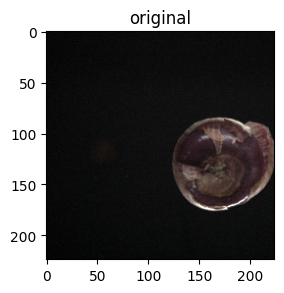

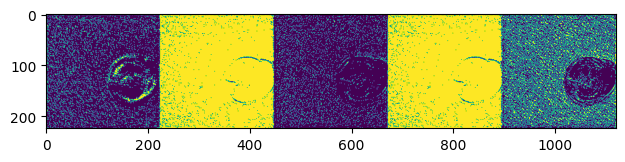

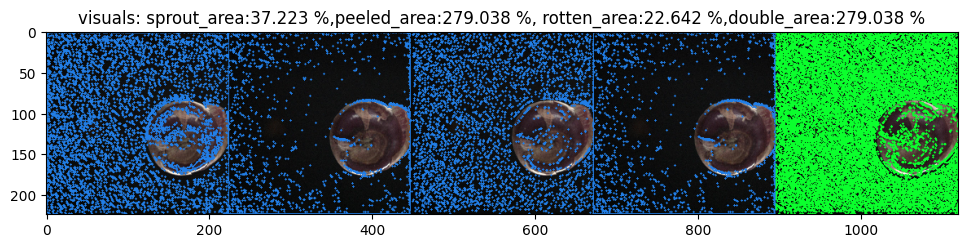

name of the image 54_1.jpg
Time taken for pred is :  0.04524350166320801 sec


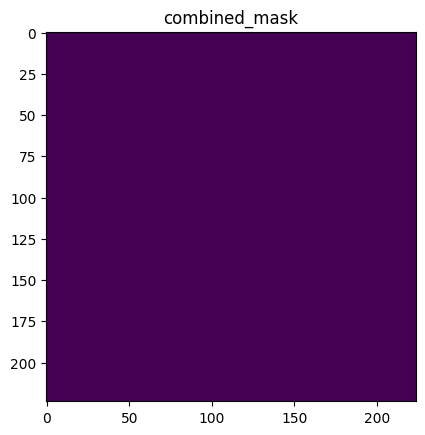

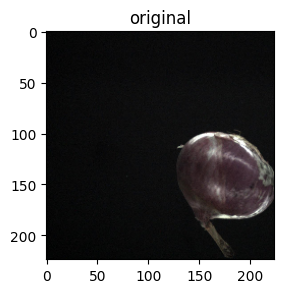

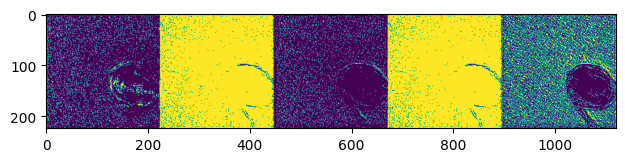

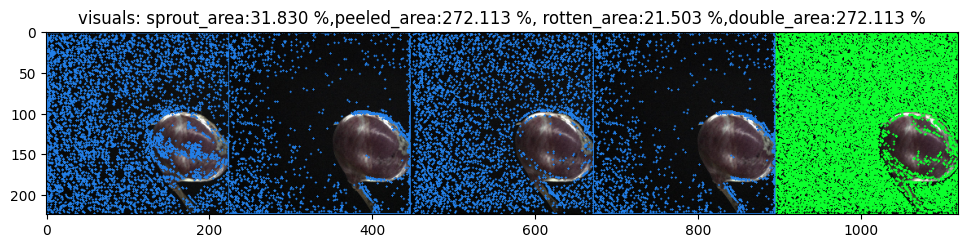

name of the image 020723_01_204_1.jpg
Time taken for pred is :  0.05226612091064453 sec


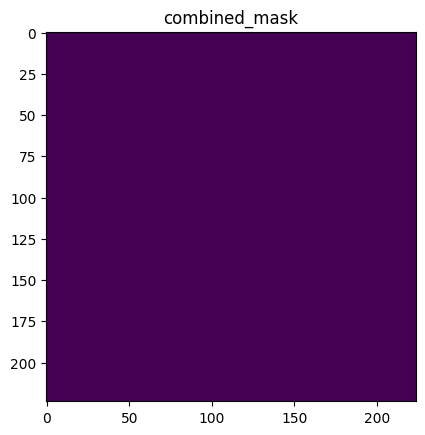

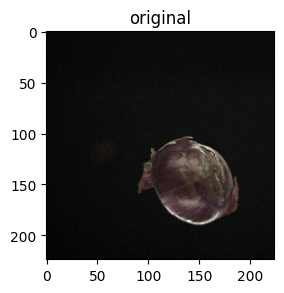

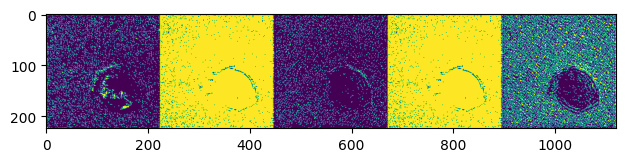

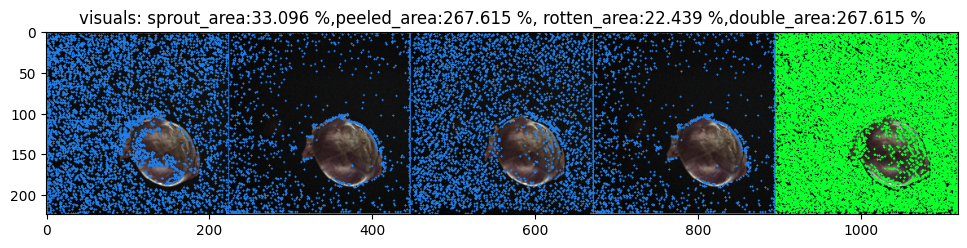

name of the image 334_1.jpg
Time taken for pred is :  0.05518364906311035 sec


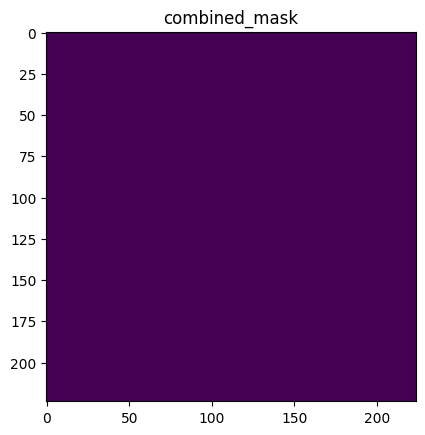

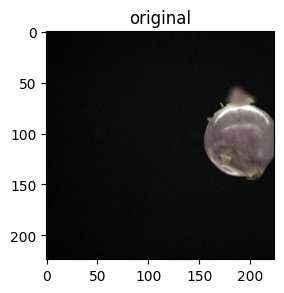

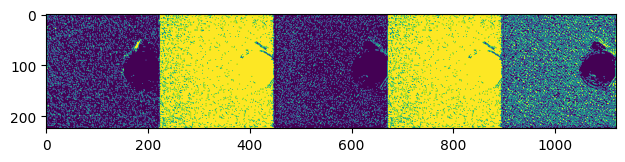

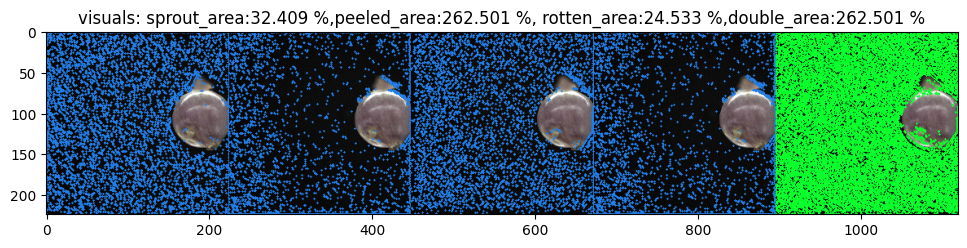

name of the image 020723_01_197_1.jpg
Time taken for pred is :  0.04924654960632324 sec


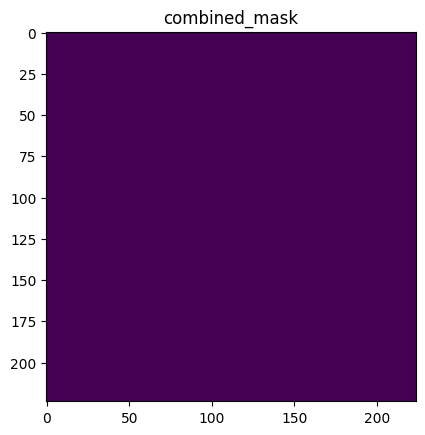

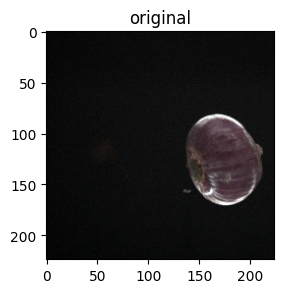

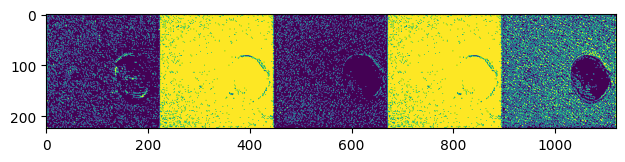

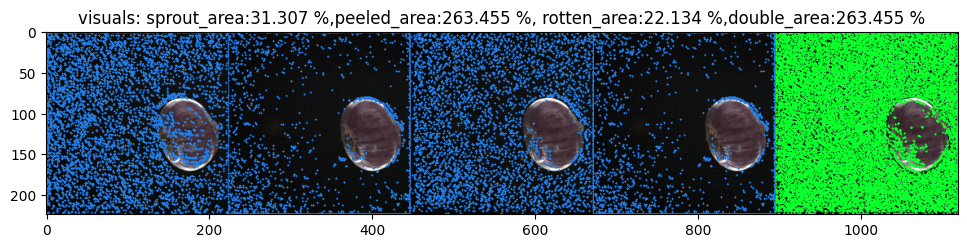

name of the image 53_1.jpg
Time taken for pred is :  0.05408620834350586 sec


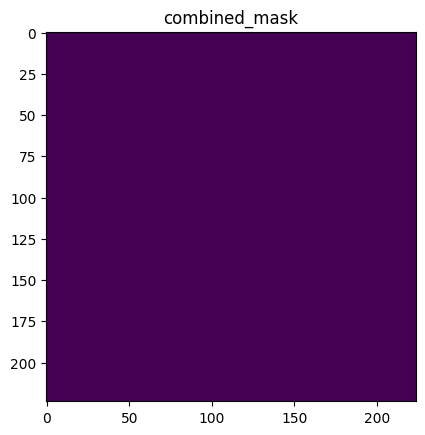

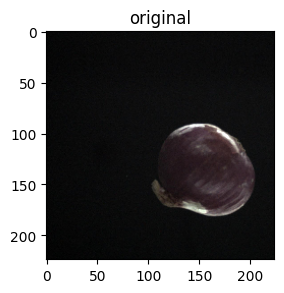

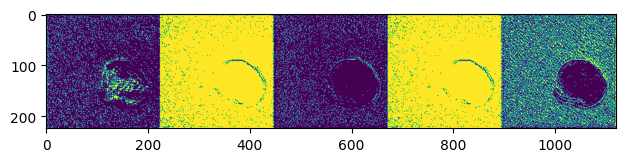

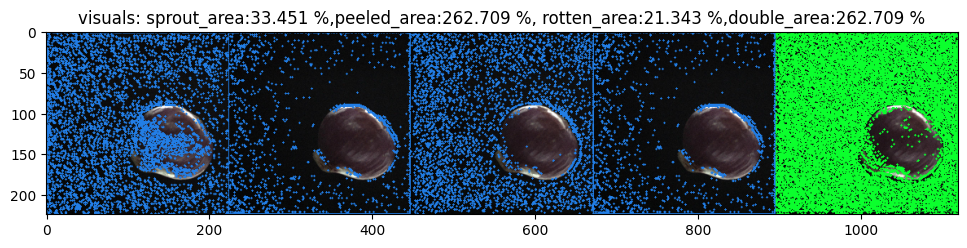

name of the image 353_1.jpg
Time taken for pred is :  0.046082258224487305 sec


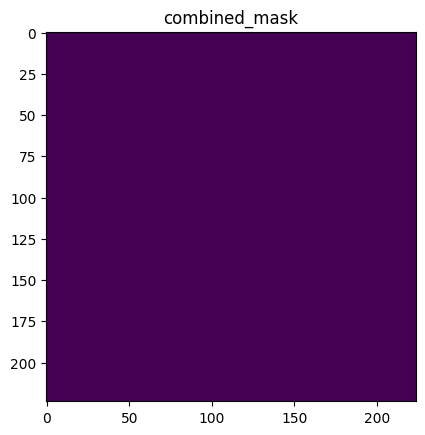

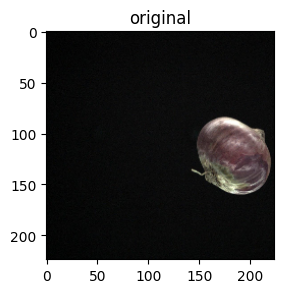

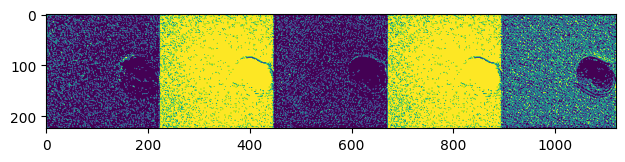

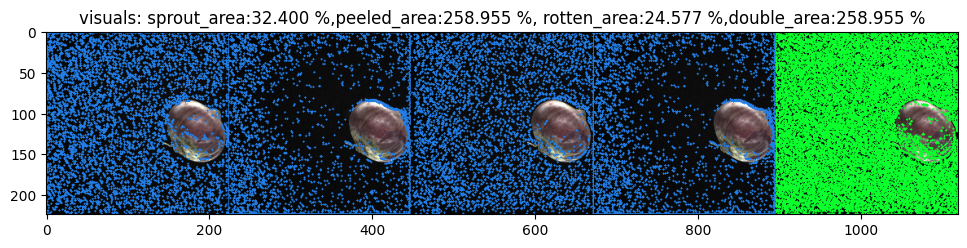

name of the image 341_1.jpg
Time taken for pred is :  0.057883262634277344 sec


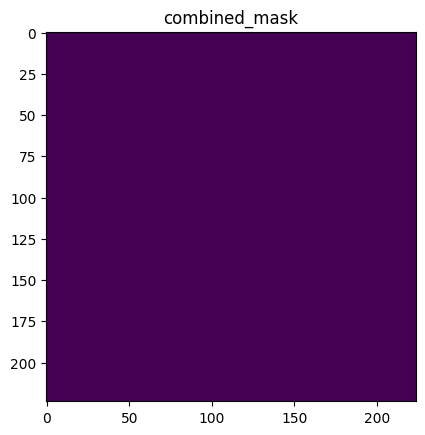

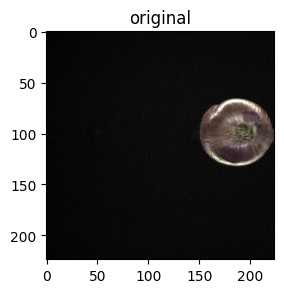

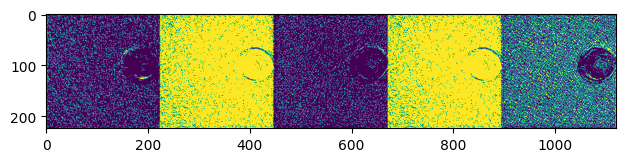

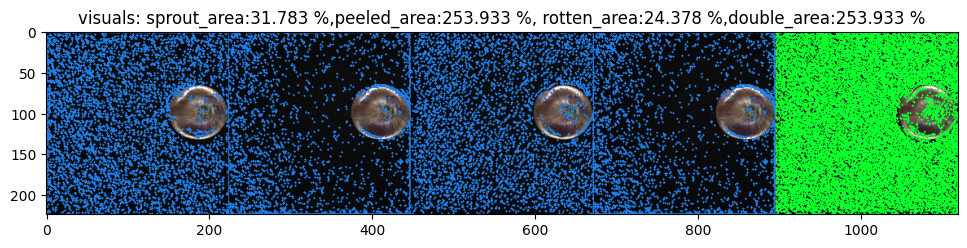

In [10]:
img_path=r'/home/agrograde/Desktop/6th_july/test/test_images/peeled'
getPrediction(img_path)